# StyleGAN2

This notebook demonstrates how to run NVIDIA's StyleGAN2 on Google Colab.
Make sure to specify a GPU runtime.

This notebook mainly adds a few convenience functions. 

For information on StyleGAN2, see:

Paper: https://arxiv.org/abs/1812.04948

Video: https://youtu.be/kSLJriaOumA

Code: https://github.com/NVlabs/stylegan

FFHQ: https://github.com/NVlabs/ffhq-dataset

/Aaron Gokaslan + Mikael Christensen, 2019.


Modifié par Corentin ANTOINE.

In [ ]:
!nvidia-smi -L

GPU 0: Tesla P100-PCIE-16GB (UUID: GPU-b8c23fc0-7802-0aed-d79b-2d45ceafa3a4)


In [ ]:
Character = "nanami_chiaki"
Mirroring = "true"

In [ ]:
#Crash for more RAM moahaha
#d=[]
#while(1):
#  d.append('1')

In [ ]:
from google.colab import auth
auth.authenticate_user()
print('Authenticated')

Authenticated


In [ ]:
from google.cloud import bigquery

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&response_type=code&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly

Enter your authorization code:
··········
Mounted at /content/drive


In [ ]:
%tensorflow_version 1.x
import tensorflow as tf
!pip install googledrivedownloader


# Download the code
%cd /content/
!git clone https://github.com/NVlabs/stylegan2.git
%cd /content/stylegan2

!nvcc test_nvcc.cu -o test_nvcc -run

print('Tensorflow version: {}'.format(tf.__version__) )
!nvidia-smi -L
print('GPU Identified at: {}'.format(tf.test.gpu_device_name()))

TensorFlow 1.x selected.
/content
Cloning into 'stylegan2'...
remote: Enumerating objects: 93, done.
remote: Total 93 (delta 0), reused 0 (delta 0), pack-reused 93
Unpacking objects: 100% (93/93), done.
/content/stylegan2
CPU says hello.
GPU says hello.
Tensorflow version: 1.15.2
GPU 0: Tesla P100-PCIE-16GB (UUID: GPU-b8c23fc0-7802-0aed-d79b-2d45ceafa3a4)
GPU Identified at: /device:GPU:0


Google Bigquery import for ID download

In [ ]:
import pandas as pd
import numpy as np
!pip install --upgrade gallery-dl
!apt-get install parallel
import os
import shutil
import cv2
import sys
import os.path
#Required packages for cleanup
!apt-get install fdupes
!apt-get update
!apt install imagemagick
#For image filtering
!pip install Pillow
!pip install Image
from PIL import Image


     |████████████████████████████████| 378kB 2.8MB/s 
Reading package lists... Done
Building dependency tree       
Reading state information... Done
The following additional packages will be installed:
  cron sysstat
Suggested packages:
  anacron logrotate checksecurity exim4 | postfix | mail-transport-agent isag
The following NEW packages will be installed:
  cron parallel sysstat
0 upgraded, 3 newly installed, 0 to remove and 32 not upgraded.
Need to get 624 kB of archives.
After this operation, 2,470 kB of additional disk space will be used.
Get:1 http://archive.ubuntu.com/ubuntu bionic/main amd64 cron amd64 3.0pl1-128.1ubuntu1 [68.8 kB]
Get:2 http://archive.ubuntu.com/ubuntu bionic-updates/main amd64 sysstat amd64 11.6.1-1ubuntu0.1 [295 kB]
Get:3 http://archive.ubuntu.com/ubuntu bionic/universe amd64 parallel all 20161222-1 [260 kB]
Fetched 624 kB in 1s (803 kB/s)
Preconfiguring packages ...
Selecting previously unselected package cron.
(Reading database ... 144467 files and dire

In [ ]:
#%%bigquery --project elaborate-night-256517 ID_List
client = bigquery.Client(project="elaborate-night-256517")

query = """#standardSQL
WITH Charas AS (SELECT
  posts.ID, tags, score
FROM danbooru-data.danbooru.posts, UNNEST(tags) as t
WHERE t.name = @Character AND rating = "s"
ORDER BY score desc)
, Solo AS (Select 
Charas.ID, tags, score
From Charas, UNNEST(tags) as t
WHERE t.name = "solo"
ORDER BY score desc
LIMIT 30000)
Select Solo.ID
From Solo, UNNEST(tags) as t
WHERE t.name = "looking_at_viewer"
ORDER BY score desc
LIMIT 1500"""
job_config = bigquery.QueryJobConfig(
    query_parameters=[
        bigquery.ScalarQueryParameter("Character", "STRING", Character)])
#query_job = client.query(query)  # API request
ID_List = client.query(query, job_config=job_config).to_dataframe()

Prepend URL and check ID list

In [ ]:
ID_List['ID'] =['https://danbooru.donmai.us/posts/' + str(ID) for ID in ID_List['ID']]
ID_List

,ID
0,https://danbooru.donmai.us/posts/3470179
1,https://danbooru.donmai.us/posts/2512633
2,https://danbooru.donmai.us/posts/2493854
3,https://danbooru.donmai.us/posts/3819868
4,https://danbooru.donmai.us/posts/1748968
...,...
266,https://danbooru.donmai.us/posts/3362008
267,https://danbooru.donmai.us/posts/3374337
268,https://danbooru.donmai.us/posts/2076101
269,https://danbooru.donmai.us/posts/3255951


In [ ]:
Index = ID_List.iloc[:,0]
Index

0      https://danbooru.donmai.us/posts/3470179
1      https://danbooru.donmai.us/posts/2512633
2      https://danbooru.donmai.us/posts/2493854
3      https://danbooru.donmai.us/posts/3819868
4      https://danbooru.donmai.us/posts/1748968
                         ...                   
266    https://danbooru.donmai.us/posts/3362008
267    https://danbooru.donmai.us/posts/3374337
268    https://danbooru.donmai.us/posts/2076101
269    https://danbooru.donmai.us/posts/3255951
270    https://danbooru.donmai.us/posts/1928121
Name: ID, Length: 271, dtype: object

In [ ]:
for x in range(len(ID_List.index)):
  ID = ID_List.iloc[x, 0]
  !gallery-dl -d "Extracted_Images", $ID

Extracted_Images,/danbooru/danbooru_3470179_4c0e6598c0f58431f7c44a2ad0119bf2.jp…Extracted_Images,/danbooru/danbooru_3470179_4c0e6598c0f58431f7c44a2ad0119bf2.jpg
Extracted_Images,/danbooru/danbooru_2512633_80f359e1e17bf922762b60ef4670a51b.jp…Extracted_Images,/danbooru/danbooru_2512633_80f359e1e17bf922762b60ef4670a51b.jpg
Extracted_Images,/danbooru/danbooru_2493854_824fd8e166c004adcb31e192f39336d1.jp…Extracted_Images,/danbooru/danbooru_2493854_824fd8e166c004adcb31e192f39336d1.jpg
Extracted_Images,/danbooru/danbooru_3819868_0698bd49cf9f2b50583e2e47532e0d3f.pn…Extracted_Images,/danbooru/danbooru_3819868_0698bd49cf9f2b50583e2e47532e0d3f.png
Extracted_Images,/danbooru/danbooru_1748968_da92f733be337fd7fcb6017d058e22c4.jp…Extracted_Images,/danbooru/danbooru_1748968_da92f733be337fd7fcb6017d058e22c4.jpg
Extracted_Images,/danbooru/danbooru_2603604_2ec168377d73a59b451d9445ca668df2.pn…Extracted_Images,/danbooru/danbooru_2603604_2ec168377d73a59b451d9445ca668df2.png
Extracted_Images,/danbooru/danboor

In [ ]:
#import shutil
#shutil.move("/content/stylegan2/Extracted_Images/danbooru","/content/stylegan2/Extracted_Images,/danbooru")

In [ ]:
dir_name = "/content/stylegan2/Extracted_Images,/danbooru/"
test = os.listdir(dir_name)

for item in test:
    if item.endswith(".jpg"):
        print("ok")
    elif item.endswith(".png"):
        print("ok")
    else:
        os.remove(os.path.join(dir_name, item))
data = []
for folder in sorted(os.listdir("/content/stylegan2/Extracted_Images,/danbooru/")):
        data.append((folder))
df = pd.DataFrame(data, columns=['Folder'])
print (df)


ok
ok
ok
ok
ok
ok
ok
ok
ok
ok
ok
ok
ok
ok
ok
ok
ok
ok
ok
ok
ok
ok
ok
ok
ok
ok
ok
ok
ok
ok
ok
ok
ok
ok
ok
ok
ok
ok
ok
ok
ok
ok
ok
ok
ok
ok
ok
ok
ok
ok
ok
ok
ok
ok
ok
ok
ok
ok
ok
ok
ok
ok
ok
ok
ok
ok
ok
ok
ok
ok
ok
ok
ok
ok
ok
ok
ok
ok
ok
ok
ok
ok
ok
ok
ok
ok
ok
ok
ok
ok
ok
ok
ok
ok
ok
ok
ok
ok
ok
ok
ok
ok
ok
ok
ok
ok
ok
ok
ok
ok
ok
ok
ok
ok
ok
ok
ok
ok
ok
ok
ok
ok
ok
ok
ok
ok
ok
ok
ok
ok
ok
ok
ok
ok
ok
ok
ok
ok
ok
ok
ok
ok
ok
ok
ok
ok
ok
ok
ok
ok
ok
ok
ok
ok
ok
ok
ok
ok
ok
ok
ok
ok
ok
ok
ok
ok
ok
ok
ok
ok
ok
ok
ok
ok
ok
ok
ok
ok
ok
ok
ok
ok
ok
ok
ok
ok
ok
ok
ok
ok
ok
ok
ok
ok
ok
ok
ok
ok
ok
ok
ok
ok
ok
ok
ok
ok
ok
ok
ok
ok
ok
ok
ok
ok
ok
ok
ok
ok
ok
ok
ok
ok
ok
ok
ok
ok
ok
ok
ok
ok
ok
ok
ok
ok
ok
ok
ok
ok
ok
ok
ok
ok
ok
ok
ok
ok
ok
ok
ok
ok
ok
ok
ok
ok
ok
ok
ok
ok
ok
ok
ok
ok
ok
ok
ok
ok
ok
ok
                                                Folder
0    danbooru_1251328_42e46b1a13de3615c8c6603fe1e17...
1    danbooru_1255235_ddf73bef5eaae27965e469445bfcd...
2    danbooru_1269093_b444a146f

In [ ]:
#Change directory
!mkdir Danbooru_Faces
%cd Danbooru_Faces

/content/stylegan2/Danbooru_Faces


Extract faces

In [ ]:
def detect(cascade_file, filename, outputname):
    if not os.path.isfile(cascade_file):
        raise RuntimeError("%s: not found" % cascade_file)

    cascade = cv2.CascadeClassifier(cascade_file)
    image = cv2.imread(filename)
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    gray = cv2.equalizeHist(gray)

    ## NOTE: Suggested modification: increase minSize to '(250,250)' px,
    ## increasing proportion of high-quality faces & reducing
    ## false positives. Faces which are only 50x50px are useless
    ## and often not faces at all.
    ## For my StyleGANs, I use 250 or 300px boxes

    faces = cascade.detectMultiScale(gray,
                                     # detector options
                                     scaleFactor = 1.1,
                                     minNeighbors = 5,
                                     minSize = (256, 256))
    i=0
    for (x, y, w, h) in faces:
        cropped = image[int(y*0.25): y + h, int(x*0.90): x + int(w*1.25)]
        cv2.imwrite(outputname+str(i)+".png", cropped)
        i=i+1

##if len(sys.argv) != 4:
##    sys.stderr.write("usage: detect.py <animeface.xml file>  <input> <output prefix>\n")
##    sys.exit(-1)
for x in range(len(df.index)):
  File = df.iloc[x, 0]
  Full_Loc = "/content/stylegan2/Extracted_Images,/danbooru/"+str(File)
  detect("/content/drive/My Drive/Colab Notebooks/lbpcascade_animeface.xml", Full_Loc, "Face"+str(x))

In [ ]:
dir_name = "/content/stylegan2/Danbooru_Faces/"
test = os.listdir(dir_name)
Filtered_List = []
for folder in sorted(os.listdir("/content/stylegan2/Danbooru_Faces/")):
        Filtered_List.append((folder))
FL = pd.DataFrame(Filtered_List, columns=['Folder'])
print (FL)

           Folder
0      Face00.png
1    Face1000.png
2    Face1020.png
3    Face1060.png
4    Face1070.png
..            ...
134   Face830.png
135   Face870.png
136   Face930.png
137   Face960.png
138   Face990.png

[139 rows x 1 columns]


In [ ]:
#Cleanup Duty
## Delete failed/empty files
!find /content/stylegan2/Danbooru_Faces/ -size 0    -type f -delete

## Delete 'too small' files which is indicative of low quality:
!find /content/stylegan2/Danbooru_Faces/ -size -40k -type f -delete

## Delete exact duplicates:
!fdupes --delete --omitfirst --noprompt /content/stylegan2/Danbooru_Faces/

## Delete monochrome or minimally-colored images:
### the heuristic of <257 unique colors is imperfect but better than anything else I tried
!deleteBW() { if [[ `identify -format "%k" "$@"` -lt 257 ]]; then rm "$@"; fi; } ; export -f deleteBW ; find /content/stylegan2/Danbooru_Faces/ -type f | parallel --progress deleteBW

Academic tradition requires you to cite works you base your article on.
When using programs that use GNU Parallel to process data for publication
please cite:

  O. Tange (2011): GNU Parallel - The Command-Line Power Tool,
  ;login: The USENIX Magazine, February 2011:42-47.

This helps funding further development; AND IT WON'T COST YOU A CENT.
If you pay 10000 EUR you should feel free to use GNU Parallel without citing.

To silence this citation notice: run 'parallel --citation'.


Computers / CPU cores / Max jobs to run
1:local / 4 / 4

Computer:jobs running/jobs completed/%of started jobs/Average seconds to complete
local:0/139/100%/0.1s 


In [ ]:
#Actualise list of faces
dir_name = "/content/stylegan2/Danbooru_Faces/"
test = os.listdir(dir_name)
Filtered_List = []
for folder in sorted(os.listdir("/content/stylegan2/Danbooru_Faces/")):
        Filtered_List.append((folder))
FL = pd.DataFrame(Filtered_List, columns=['Folder'])
#IF NOTEBOOK CHECKPOINT
#FL = FL.drop([0])
print (FL)

           Folder
0      Face00.png
1    Face1000.png
2    Face1020.png
3    Face1060.png
4    Face1070.png
..            ...
134   Face830.png
135   Face870.png
136   Face930.png
137   Face960.png
138   Face990.png

[139 rows x 1 columns]


In [ ]:
#!pip uninstall cupy-cuda101
#!pip list

In [ ]:
#Install Waifu2x for upscaling


!pip install -q futures
!pip install -q chainer
#!pip uninstall cupy-cuda101 -y
#!pip install 'cupy-cuda101>=6.5.0,<7.0.0'

!git clone -l -s https://github.com/tsurumeso/waifu2x-chainer.git waifu2x-chainer
%cd waifu2x-chainer
shutil.move("/content/stylegan2/Danbooru_Faces/waifu2x-chainer/","/content/stylegan2/")


Cloning into 'waifu2x-chainer'...
remote: Enumerating objects: 1474, done.
remote: Total 1474 (delta 0), reused 0 (delta 0), pack-reused 1474
Receiving objects: 100% (1474/1474), 185.55 MiB | 54.79 MiB/s, done.
Resolving deltas: 100% (833/833), done.
/content/stylegan2/Danbooru_Faces/waifu2x-chainer


'/content/stylegan2/waifu2x-chainer'

In [ ]:
%cd ..
%cd ..
%cd /content/stylegan2/waifu2x-chainer

/content/stylegan2
/content
/content/stylegan2/waifu2x-chainer


In [ ]:
#!pip uninstall cupy-cuda100 -y
#!pip install 'cupy-cuda101>=6.5.0,<7.0.0'

In [ ]:
#!python waifu2x.py -m scale -i "/content/stylegan2/Extracted_Images,/danbooru/danbooru_1021634_f9a40b7623bff23083e1ddf15d7620aa.png" -o "/content/stylegan2/Extracted_Images,/danbooru/danbooru_1021634_f9a40b7623bff23083e1ddf15d7620aaUpscaled.pngupscaled" -g 0 -s 2 -a 0 -n 1

In [ ]:
import subprocess
import os
import waifu2x

In [ ]:
#!python waifu2x.py --help

In [ ]:
#Upscales images too small


for x in range(len(FL.index)):
  File = FL.iloc[x, 0]
  Full_Loc_Bis = "/content/stylegan2/Danbooru_Faces/"+str(File)
  print (Full_Loc_Bis)
  im = Image.open(Full_Loc_Bis)
  Width, Height = im.size
  if Width < 512 and Height < 512:
    Full_Loc_Future = "/content/stylegan2/Danbooru_Faces/"
#   Full_Command = "python waifu2x.py -m scale -i "+str(Full_Loc_Bis)+" -o "+str(Full_Loc_Future)+" -g 0 -s 2 -a 0 -n 1)"
    !python waifu2x.py -m scale -i $Full_Loc_Bis -o $Full_Loc_Future -g 0 -s 2 -a 0 -n 1
    print ("upscaled " + Full_Loc_Bis)
    os.remove(Full_Loc_Bis)
  

/content/stylegan2/Danbooru_Faces/Face00.png
2.0x scaling... OK
Elapsed time: 5.074656 sec
Saved as '/content/stylegan2/Danbooru_Faces/Face00_(scale2.0x)(VGG7_rgb).png'
upscaled /content/stylegan2/Danbooru_Faces/Face00.png
/content/stylegan2/Danbooru_Faces/Face1000.png
/content/stylegan2/Danbooru_Faces/Face1020.png
2.0x scaling... OK
Elapsed time: 1.251641 sec
Saved as '/content/stylegan2/Danbooru_Faces/Face1020_(scale2.0x)(VGG7_rgb).png'
upscaled /content/stylegan2/Danbooru_Faces/Face1020.png
/content/stylegan2/Danbooru_Faces/Face1060.png
2.0x scaling... OK
Elapsed time: 1.262722 sec
Saved as '/content/stylegan2/Danbooru_Faces/Face1060_(scale2.0x)(VGG7_rgb).png'
upscaled /content/stylegan2/Danbooru_Faces/Face1060.png
/content/stylegan2/Danbooru_Faces/Face1070.png
/content/stylegan2/Danbooru_Faces/Face1080.png
/content/stylegan2/Danbooru_Faces/Face110.png
/content/stylegan2/Danbooru_Faces/Face1100.png
2.0x scaling... OK
Elapsed time: 1.235393 sec
Saved as '/content/stylegan2/Danbooru_F

In [ ]:
#Actualise list of faces
dir_name = "/content/stylegan2/Danbooru_Faces/"
test = os.listdir(dir_name)
Filtered_List = []
for folder in sorted(os.listdir("/content/stylegan2/Danbooru_Faces/")):
        Filtered_List.append((folder))
FL = pd.DataFrame(Filtered_List, columns=['Folder'])
#IF NOTEBOOK CHECKPOINT
#FL = FL.drop([0])
print (FL)

                                 Folder
0      Face00_(scale2.0x)(VGG7_rgb).png
1                          Face1000.png
2    Face1020_(scale2.0x)(VGG7_rgb).png
3    Face1060_(scale2.0x)(VGG7_rgb).png
4                          Face1070.png
..                                  ...
134                         Face830.png
135   Face870_(scale2.0x)(VGG7_rgb).png
136                         Face930.png
137   Face960_(scale2.0x)(VGG7_rgb).png
138   Face990_(scale2.0x)(VGG7_rgb).png

[139 rows x 1 columns]


In [ ]:
%cd ..
%cd Danbooru_Faces/

/content/stylegan2
/content/stylegan2/Danbooru_Faces


In [ ]:
%cd /content/stylegan2/Danbooru_Faces

/content/stylegan2/Danbooru_Faces


In [ ]:
%%bash
dataAugment () { 
    File="$@" 
    Suffix="png" 
    convert -resize 108%x100% "$File" "$File".horizstretch."$Suffix" 
    convert -resize 100%x108% "$File" "$File".vertstretch."$Suffix" 
    convert -adaptive-blur 3x2 "$File" "$File".blur."$Suffix" 
    convert -adaptive-sharpen 3x2 "$File" "$File".sharpen."$Suffix" 
    convert -brightness-contrast 6x6 "$File" "$File".brightercontraster."$Suffix" 
    convert -brightness-contrast -6x6 "$File" "$File".darkerlesscontrast."$Suffix"; } 
export -f dataAugment 
find /content/stylegan2/Danbooru_Faces -type f | parallel --progress dataAugment


Computers / CPU cores / Max jobs to run
1:local / 4 / 4

Computer:jobs running/jobs completed/%of started jobs/Average seconds to complete
local:0/139/100%/1.4s 


In [ ]:
#Actualise list of faces
dir_name = "/content/stylegan2/Danbooru_Faces/"
test = os.listdir(dir_name)
Filtered_List = []
for folder in sorted(os.listdir("/content/stylegan2/Danbooru_Faces/")):
        Filtered_List.append((folder))
FL = pd.DataFrame(Filtered_List, columns=['Folder'])
#IF NOTEBOOK CHECKPOINT
#FL = FL.drop([0])
print (FL)

                                                Folder
0                     Face00_(scale2.0x)(VGG7_rgb).png
1            Face00_(scale2.0x)(VGG7_rgb).png.blur.png
2    Face00_(scale2.0x)(VGG7_rgb).png.brightercontr...
3    Face00_(scale2.0x)(VGG7_rgb).png.darkerlesscon...
4    Face00_(scale2.0x)(VGG7_rgb).png.horizstretch.png
..                                                 ...
968  Face990_(scale2.0x)(VGG7_rgb).png.brightercont...
969  Face990_(scale2.0x)(VGG7_rgb).png.darkerlessco...
970  Face990_(scale2.0x)(VGG7_rgb).png.horizstretch...
971      Face990_(scale2.0x)(VGG7_rgb).png.sharpen.png
972  Face990_(scale2.0x)(VGG7_rgb).png.vertstretch.png

[973 rows x 1 columns]


In [ ]:
#Old treatment replaced
#for x in range(len(FL.index)):
#  File = FL.iloc[x, 0]
#  Suffix = "png"
#  !convert -quality 33 "$File" "$File".jpg && rm "$File"

In [ ]:
!find -type f | xargs --max-procs=16 -n 9000 \
  mogrify -resize 512x512\> -extent 512x512\> -gravity center -background black -colorspace srgb -format jpg -quality 40

In [ ]:
#for x in range(len(FL.index)):
#  File = FL.iloc[x, 0]
#  Suffix = "png"
#  !mogrify -resize 512x512\> -extent 512x512\> -gravity center -background black -colorspace srgb

In [ ]:
#Checkpoint : Zip the whole thing
#!zip -r "/content/drive/My Drive/FacesSaber.zip" /content/stylegan2/Danbooru_Faces

In [ ]:
#Checkpoint : Unzip the whole thing
#%cd ..
#%cd ..
#%cd ..
#!unzip "FacesMarisa2.zip"

In [ ]:
!find /content/stylegan2/Danbooru_Faces -type f | xargs --max-procs=16 -n 9000 identify | \
    fgrep -v " JPEG 512x512 512x512+0+0 8-bit sRGB"| cut -d ' ' -f 1| \
    xargs --max-procs=16 -n 10000 rm

In [ ]:
%cd ..

/content/stylegan2


In [ ]:
#Overwrite config and metrics file
%cd ..
%cd ..
!cp "/content/drive/My Drive/Colab Notebooks/frechet_inception_distance.py" "/content/stylegan2/metrics/"
!cp "/content/drive/My Drive/Colab Notebooks/training_loop.py" "/content/stylegan2/training/"
%cd content/stylegan2

/content
/
/content/stylegan2


In [ ]:
# Download the model of choice
import argparse
import numpy as np
import PIL.Image
import dnnlib
import dnnlib.tflib as tflib
import re
import sys
from io import BytesIO
import IPython.display
import numpy as np
from math import ceil
from PIL import Image, ImageDraw
import imageio

import pretrained_networks

import hashlib 

from google_drive_downloader import GoogleDriveDownloader as gdd

# Choose between these pretrained models - I think 'f' is the best choice:

# 1024×1024 faces
# stylegan2-ffhq-config-a.pkl
# stylegan2-ffhq-config-b.pkl
# stylegan2-ffhq-config-c.pkl
# stylegan2-ffhq-config-d.pkl
# stylegan2-ffhq-config-e.pkl
# stylegan2-ffhq-config-f.pkl

# 512×384 cars
# stylegan2-car-config-a.pkl
# stylegan2-car-config-b.pkl
# stylegan2-car-config-c.pkl
# stylegan2-car-config-d.pkl
# stylegan2-car-config-e.pkl
# stylegan2-car-config-f.pkl

# 256x256 horses
# stylegan2-horse-config-a.pkl
# stylegan2-horse-config-f.pkl

# 256x256 churches
# stylegan2-church-config-a.pkl
# stylegan2-church-config-f.pkl

# 256x256 cats
# stylegan2-cat-config-f.pkl
# stylegan2-cat-config-a.pkl
#network_pkl = "gdrive:networks/stylegan2-ffhq-config-f.pkl"

# StyleGAN2 Danbooru Portrait
url = 'https://drive.google.com/open?id=1WNQELgHnaqMTq3TlrnDaVkyrAH8Zrjez'
#'https://drive.google.com/open?id=1BHeqOZ58WZ-vACR2MJkh1ZVbJK2B-Kle'
model_id = url.replace('https://drive.google.com/open?id=', '')

network_pkl = '/content/models/model_%s.pkl' % model_id#(hashlib.md5(model_id.encode()).hexdigest())
gdd.download_file_from_google_drive(file_id=model_id,
                                    dest_path=network_pkl)




# If downloads fails, due to 'Google Drive download quota exceeded' you can try downloading manually from your own Google Drive account
# network_pkl = "/content/drive/My Drive/GAN/stylegan2-ffhq-config-f.pkl"

print('Loading networks from "%s"...' % network_pkl)
_G, _D, Gs = pretrained_networks.load_networks(network_pkl)
noise_vars = [var for name, var in Gs.components.synthesis.vars.items() if name.startswith('noise')]

Loading networks from "/content/models/model_1WNQELgHnaqMTq3TlrnDaVkyrAH8Zrjez.pkl"...
Setting up TensorFlow plugin "fused_bias_act.cu": Preprocessing... Compiling... Loading... Done.
Setting up TensorFlow plugin "upfirdn_2d.cu": Preprocessing... Compiling... Loading... Done.


In [ ]:
#Create new dataset
!python dataset_tool.py create_from_images Chara_Dataset /content/stylegan2/Danbooru_Faces

Loading images from "/content/stylegan2/Danbooru_Faces"
Creating dataset "Chara_Dataset"
Added 973 images.


In [ ]:
#Create dataset directory and move to it.
!mkdir datasets
!mv /content/stylegan2/Chara_Dataset /content/stylegan2/datasets


In [ ]:
Training_Folder = "/content/drive/My Drive/Colab Notebooks/"+str(Character)
print(Training_Folder)

/content/drive/My Drive/Colab Notebooks/nanami_chiaki


In [ ]:
!python run_training.py --result-dir "$Training_Folder" --data-dir /content/stylegan2/datasets --dataset Chara_Dataset --num-gpus 1 --mirror-augment $Mirroring --total-kimg 7034 --metrics none --config config-f

Local submit - run_dir: /content/drive/My Drive/Colab Notebooks/nanami_chiaki/00000-stylegan2-Chara_Dataset-1gpu-config-f
dnnlib: Running training.training_loop.training_loop() on localhost...
Streaming data using training.dataset.TFRecordDataset...
tcmalloc: large alloc 4294967296 bytes == 0x6cfe000 @  0x7fb1db8c4001 0x7fb1d8350765 0x7fb1d83b4bb0 0x7fb1d83b6a4f 0x7fb1d844d048 0x50a635 0x50cd96 0x507d64 0x509042 0x594931 0x549e5f 0x5513d1 0x59fc4e 0x50d356 0x507d64 0x588e5c 0x59fc4e 0x50d356 0x507d64 0x588e5c 0x59fc4e 0x50d356 0x509758 0x50a48d 0x50bfb4 0x509758 0x50a48d 0x50bfb4 0x507d64 0x588e5c 0x59fc4e
tcmalloc: large alloc 4294967296 bytes == 0x7fb0129be000 @  0x7fb1db8c21e7 0x7fb1d83505e1 0x7fb1d83b4c78 0x7fb1d83b4f37 0x7fb1d844cf28 0x50a635 0x50cd96 0x507d64 0x509a90 0x50a48d 0x50cd96 0x507d64 0x509a90 0x50a48d 0x50cd96 0x507d64 0x509a90 0x50a48d 0x50cd96 0x509758 0x50a48d 0x50bfb4 0x507d64 0x509a90 0x50a48d 0x50bfb4 0x507d64 0x509a90 0x50a48d 0x50cd96 0x507d64
tcmalloc: large a

In [ ]:
#reload retrained network
network_pkl = "/content/drive/My Drive/Colab Notebooks/"+str(Character)+"/00000-stylegan2-Chara_Dataset-1gpu-config-f/network-final.pkl"
print (network_pkl)
_G, _D, Gs = pretrained_networks.load_networks(network_pkl)
noise_vars = [var for name, var in Gs.components.synthesis.vars.items() if name.startswith('noise')]

/content/drive/My Drive/Colab Notebooks/nanami_chiaki/00000-stylegan2-Chara_Dataset-1gpu-config-f/network-final.pkl


In [ ]:
# Useful utility functions...

# Generates a list of images, based on a list of latent vectors (Z), and a list (or a single constant) of truncation_psi's.
def generate_images_in_w_space(dlatents, truncation_psi):
    Gs_kwargs = dnnlib.EasyDict()
    Gs_kwargs.output_transform = dict(func=tflib.convert_images_to_uint8, nchw_to_nhwc=True)
    Gs_kwargs.randomize_noise = False
    Gs_kwargs.truncation_psi = truncation_psi
    dlatent_avg = Gs.get_var('dlatent_avg') # [component]

    imgs = []
    for row, dlatent in log_progress(enumerate(dlatents), name = "Generating images"):
        #row_dlatents = (dlatent[np.newaxis] - dlatent_avg) * np.reshape(truncation_psi, [-1, 1, 1]) + dlatent_avg
        dl = (dlatent-dlatent_avg)*truncation_psi   + dlatent_avg
        row_images = Gs.components.synthesis.run(dlatent,  **Gs_kwargs)
        imgs.append(PIL.Image.fromarray(row_images[0], 'RGB'))
    return imgs       

def generate_images(zs, truncation_psi):
    Gs_kwargs = dnnlib.EasyDict()
    Gs_kwargs.output_transform = dict(func=tflib.convert_images_to_uint8, nchw_to_nhwc=True)
    Gs_kwargs.randomize_noise = False
    if not isinstance(truncation_psi, list):
        truncation_psi = [truncation_psi] * len(zs)
        
    imgs = []
    for z_idx, z in log_progress(enumerate(zs), size = len(zs), name = "Generating images"):
        Gs_kwargs.truncation_psi = truncation_psi[z_idx]
        noise_rnd = np.random.RandomState(1) # fix noise
        tflib.set_vars({var: noise_rnd.randn(*var.shape.as_list()) for var in noise_vars}) # [height, width]
        images = Gs.run(z, None, **Gs_kwargs) # [minibatch, height, width, channel]
        imgs.append(PIL.Image.fromarray(images[0], 'RGB'))
    return imgs

def generate_zs_from_seeds(seeds):
    zs = []
    for seed_idx, seed in enumerate(seeds):
        rnd = np.random.RandomState(seed)
        z = rnd.randn(1, *Gs.input_shape[1:]) # [minibatch, component]
        zs.append(z)
    return zs

# Generates a list of images, based on a list of seed for latent vectors (Z), and a list (or a single constant) of truncation_psi's.
def generate_images_from_seeds(seeds, truncation_psi):
    return generate_images(generate_zs_from_seeds(seeds), truncation_psi)

def saveImgs(imgs, location):
  for idx, img in log_progress(enumerate(imgs), size = len(imgs), name="Saving images"):
    file = location+ str(idx) + ".png"
    img.save(file)

def imshow(a, format='png', jpeg_fallback=True):
  a = np.asarray(a, dtype=np.uint8)
  str_file = BytesIO()
  PIL.Image.fromarray(a).save(str_file, format)
  im_data = str_file.getvalue()
  try:
    disp = IPython.display.display(IPython.display.Image(im_data))
  except IOError:
    if jpeg_fallback and format != 'jpeg':
      print ('Warning: image was too large to display in format "{}"; '
             'trying jpeg instead.').format(format)
      return imshow(a, format='jpeg')
    else:
      raise
  return disp

def showarray(a, fmt='png'):
    a = np.uint8(a)
    f = StringIO()
    PIL.Image.fromarray(a).save(f, fmt)
    IPython.display.display(IPython.display.Image(data=f.getvalue()))

        
def clamp(x, minimum, maximum):
    return max(minimum, min(x, maximum))
    
def drawLatent(image,latents,x,y,x2,y2, color=(255,0,0,100)):
  buffer = PIL.Image.new('RGBA', image.size, (0,0,0,0))
   
  draw = ImageDraw.Draw(buffer)
  cy = (y+y2)/2
  draw.rectangle([x,y,x2,y2],fill=(255,255,255,180), outline=(0,0,0,180))
  for i in range(len(latents)):
    mx = x + (x2-x)*(float(i)/len(latents))
    h = (y2-y)*latents[i]*0.1
    h = clamp(h,cy-y2,y2-cy)
    draw.line((mx,cy,mx,cy+h),fill=color)
  return PIL.Image.alpha_composite(image,buffer)
             
  
def createImageGrid(images, scale=0.25, rows=1):
   w,h = images[0].size
   w = int(w*scale)
   h = int(h*scale)
   height = rows*h
   cols = ceil(len(images) / rows)
   width = cols*w
   canvas = PIL.Image.new('RGBA', (width,height), 'white')
   for i,img in enumerate(images):
     img = img.resize((w,h), PIL.Image.ANTIALIAS)
     canvas.paste(img, (w*(i % cols), h*(i // cols))) 
   return canvas

def convertZtoW(latent, truncation_psi=0.7, truncation_cutoff=9):
  dlatent = Gs.components.mapping.run(latent, None) # [seed, layer, component]
  dlatent_avg = Gs.get_var('dlatent_avg') # [component]
  for i in range(truncation_cutoff):
    dlatent[0][i] = (dlatent[0][i]-dlatent_avg)*truncation_psi + dlatent_avg
    
  return dlatent

def interpolate(zs, steps):
   out = []
   for i in range(len(zs)-1):
    for index in range(steps):
     fraction = index/float(steps) 
     out.append(zs[i+1]*fraction + zs[i]*(1-fraction))
   return out

# Taken from https://github.com/alexanderkuk/log-progress
def log_progress(sequence, every=1, size=None, name='Items'):
    from ipywidgets import IntProgress, HTML, VBox
    from IPython.display import display

    is_iterator = False
    if size is None:
        try:
            size = len(sequence)
        except TypeError:
            is_iterator = True
    if size is not None:
        if every is None:
            if size <= 200:
                every = 1
            else:
                every = int(size / 200)     # every 0.5%
    else:
        assert every is not None, 'sequence is iterator, set every'

    if is_iterator:
        progress = IntProgress(min=0, max=1, value=1)
        progress.bar_style = 'info'
    else:
        progress = IntProgress(min=0, max=size, value=0)
    label = HTML()
    box = VBox(children=[label, progress])
    display(box)

    index = 0
    try:
        for index, record in enumerate(sequence, 1):
            if index == 1 or index % every == 0:
                if is_iterator:
                    label.value = '{name}: {index} / ?'.format(
                        name=name,
                        index=index
                    )
                else:
                    progress.value = index
                    label.value = u'{name}: {index} / {size}'.format(
                        name=name,
                        index=index,
                        size=size
                    )
            yield record
    except:
        progress.bar_style = 'danger'
        raise
    else:
        progress.bar_style = 'success'
        progress.value = index
        label.value = "{name}: {index}".format(
            name=name,
            index=str(index or '?')
        )





In [ ]:
# generate 175 images
import random
Lower = random.randint(1,1000000)
Middle = Lower+50
Upper = Lower+100
UpperUpper = Lower+175
Result_Loc = "/content/drive/My Drive/Colab Notebooks/"+str(Character)+"/Finished_Portraits"
!python run_generator.py generate-images --network "$network_pkl" --seeds $Lower-$Middle --truncation-psi 0.5 --result-dir "$Result_Loc"
!python run_generator.py generate-images --network "$network_pkl" --seeds $Middle-$Upper --truncation-psi 0.6 --result-dir "$Result_Loc"
!python run_generator.py generate-images --network "$network_pkl" --seeds $Upper-$UpperUpper --truncation-psi 0.7 --result-dir "$Result_Loc"

Local submit - run_dir: /content/drive/My Drive/Colab Notebooks/nanami_chiaki/Finished_Portraits/00000-generate-images
dnnlib: Running run_generator.generate_images() on localhost...
Loading networks from "/content/drive/My Drive/Colab Notebooks/nanami_chiaki/00000-stylegan2-Chara_Dataset-1gpu-config-f/network-final.pkl"...
Setting up TensorFlow plugin "fused_bias_act.cu": Preprocessing... Loading... Done.
Setting up TensorFlow plugin "upfirdn_2d.cu": Preprocessing... Loading... Done.
Generating image for seed 954440 (0/51) ...
Generating image for seed 954441 (1/51) ...
Generating image for seed 954442 (2/51) ...
Generating image for seed 954443 (3/51) ...
Generating image for seed 954444 (4/51) ...
Generating image for seed 954445 (5/51) ...
Generating image for seed 954446 (6/51) ...
Generating image for seed 954447 (7/51) ...
Generating image for seed 954448 (8/51) ...
Generating image for seed 954449 (9/51) ...
Generating image for seed 954450 (10/51) ...
Generating image for seed

In [ ]:
from IPython import display as ipythondisplay
import io
import os
import base64
from IPython.display import HTML

def show_video(vid):
  #mp4list = [video
  #if len(mp4list) > 0:
  ext = os.path.splitext(vid)[-1][1:]
  video = io.open(vid, 'r+b').read()
  #encoded = base64.b64encode(video)
  ipythondisplay.display(HTML(data='''<video alt="test" autoplay 
              loop controls style="height: 400px;">
              <source src="data:video/{1}';base64,{0}" type="video/{1}" />
              </video>'''.format(base64.b64encode(video).decode('ascii'), ext)))

[5338951 1052561 2447046 2207859 6947477 5077252 7607401 1252372 3041914
 2927051 7116098 7015053  956681 6315227 1687243 8456702 4139450 4766608
 3042203 1231070 1730044 8451333 6913719 9688970 1433991]


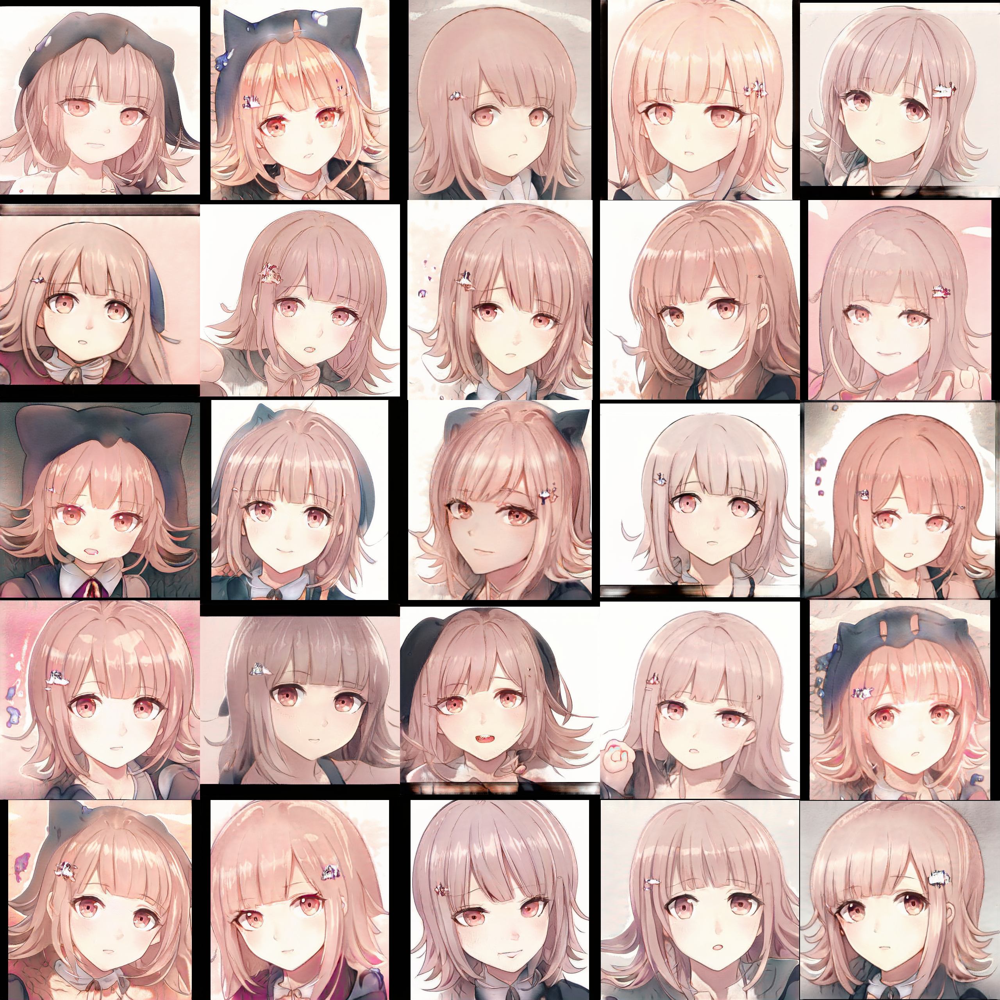

In [ ]:
# generate some random seeds
seeds = np.random.randint(10000000, size=25)
print(seeds)

# show the seeds
imshow(createImageGrid(generate_images_from_seeds(seeds, 0.5), 1 , 5))

In [ ]:
# Simple (Z) interpolation
zs = generate_zs_from_seeds([401528 , 614808 ])

latent1 = zs[0]
latent2 = zs[1]

number_of_steps = 25

imgs = generate_images(interpolate([latent1,latent2],number_of_steps), 1.0)
number_of_images = len(imgs)
imshow(createImageGrid(imgs, 0.7 , 5))

In [ ]:
# generating a MP4 movie

zs = generate_zs_from_seeds([421645,6149575,3487643,3766864 ,3857159,5360657,3720613])

number_of_steps = 10
imgs = generate_images(interpolate(zs,number_of_steps), 0.7)

# Example of reading a generated set of images, and storing as MP4.
%mkdir out
movieName = 'out/mov.mp4'

with imageio.get_writer(movieName, mode='I') as writer:
    for image in log_progress(list(imgs), name = "Creating animation"):
        writer.append_data(np.array(image))
show_video(movieName)

Taken from Progressive Growing GAN Code

In [ ]:
import scipy

grid_size = [3,3]
image_shrink = 1
image_zoom = 1
duration_sec = 10
smoothing_sec = 1.0
mp4_fps = 20
mp4_codec = 'libx264'
mp4_bitrate = '2M'#8M
random_seed = np.random.randint(0, 999)#405
mp4_file = 'random_grid_%s.mp4' % random_seed
minibatch_size = 8
truncation_psi= 0.7

num_frames = int(np.rint(duration_sec * mp4_fps))
random_state = np.random.RandomState(random_seed)

# Generate latent vectors
shape = [num_frames, np.prod(grid_size)] + Gs.input_shape[1:] # [frame, image, channel, component]
all_latents = random_state.randn(*shape).astype(np.float32)
all_latents = scipy.ndimage.gaussian_filter(all_latents, [smoothing_sec * mp4_fps] + [0] * len(Gs.input_shape), mode='wrap')
all_latents /= np.sqrt(np.mean(np.square(all_latents)))


def create_image_grid(images, grid_size=None):
    assert images.ndim == 3 or images.ndim == 4
    num, img_h, img_w, channels = images.shape

    if grid_size is not None:
        grid_w, grid_h = tuple(grid_size)
    else:
        grid_w = max(int(np.ceil(np.sqrt(num))), 1)
        grid_h = max((num - 1) // grid_w + 1, 1)

    grid = np.zeros([grid_h * img_h, grid_w * img_w, channels], dtype=images.dtype)
    for idx in range(num):
        x = (idx % grid_w) * img_w
        y = (idx // grid_w) * img_h
        grid[y : y + img_h, x : x + img_w] = images[idx]
    return grid

#def next_power_of_2(x):  
#  return 1 if x == 0 else 2**(x - 1).bit_length()

# Frame generation func for moviepy.
def make_frame(t):
    frame_idx = int(np.clip(np.round(t * mp4_fps), 0, num_frames - 1))
    latents = all_latents[frame_idx]
    fmt = dict(func=tflib.convert_images_to_uint8, nchw_to_nhwc=True)
    images = Gs.run(latents, None, truncation_psi=truncation_psi,
                          randomize_noise=False, output_transform=fmt, 
                          minibatch_size=16)

    grid = create_image_grid(images, grid_size)
    if image_zoom > 1:
        grid = scipy.ndimage.zoom(grid, [image_zoom, image_zoom, 1], order=0)
    if grid.shape[2] == 1:
        grid = grid.repeat(3, 2) # grayscale => RGB
    return grid

# Generate video.
import moviepy.editor
video_clip = moviepy.editor.VideoClip(make_frame, duration=duration_sec)
video_clip.write_videofile(mp4_file, fps=mp4_fps, codec=mp4_codec, bitrate=mp4_bitrate)

Imageio: 'ffmpeg-linux64-v3.3.1' was not found on your computer; downloading it now.
Try 1. Download from https://github.com/imageio/imageio-binaries/raw/master/ffmpeg/ffmpeg-linux64-v3.3.1 (43.8 MB)
Downloading: 8192/45929032 bytes (0.0%)712704/45929032 bytes (1.6%)2064384/45929032 bytes (4.5%)4022272/45929032 bytes (8.8%)6832128/45929032 bytes (14.9%)10117120/45929032 bytes (22.0%)13680640/45929032 bytes (29.8%)17375232/45929032 bytes (37.8%)21192704/45929032 bytes (46.1%)25042944/45929032 bytes (54.5%)28983296/45929032 bytes (63.1%)32849920/45929032 bytes (71.5%)36642816/45929032 bytes (79.8%)4055040

100%|█████████▉| 200/201 [00:49<00:00,  4.02it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: random_grid_8.mp4 



In [ ]:
# In order to download files, you can use the snippet below - this often fails for me, though, so I prefer the 'Files' browser in the sidepanel.

from google.colab import files
#files.download(movieName) 
show_video(mp4_file)


#Corase 

In [ ]:
import scipy

duration_sec = 10.0
smoothing_sec = 1.0
mp4_fps = 20
truncation_psi = 0.7

num_frames = int(np.rint(duration_sec * mp4_fps))
#random_seed = 500
random_state = np.random.RandomState(int(random_seed))


h, w = Gs.output_shape[-2:]
#src_seeds = [601]
dst_seeds = [501, 702]
style_ranges = ([0] * 7 + [range(8,16)]) * len(dst_seeds)

fmt = dict(func=tflib.convert_images_to_uint8, nchw_to_nhwc=True)
synthesis_kwargs = dict(output_transform=fmt, truncation_psi=truncation_psi, minibatch_size=16)

shape = [num_frames] + Gs.input_shape[1:] # [frame, image, channel, component]
src_latents = random_state.randn(*shape).astype(np.float32)
src_latents = scipy.ndimage.gaussian_filter(src_latents,
                                            smoothing_sec * mp4_fps,
                                            mode='wrap')
src_latents /= np.sqrt(np.mean(np.square(src_latents)))

dst_latents = np.stack(np.random.RandomState(seed).randn(Gs.input_shape[1]) for seed in dst_seeds)


src_dlatents = Gs.components.mapping.run(src_latents, None) # [seed, layer, component]
dst_dlatents = Gs.components.mapping.run(dst_latents, None) # [seed, layer, component]
src_images = Gs.components.synthesis.run(src_dlatents, randomize_noise=False, **synthesis_kwargs)
dst_images = Gs.components.synthesis.run(dst_dlatents, randomize_noise=False, **synthesis_kwargs)


canvas = PIL.Image.new('RGB', (w * (len(dst_seeds) + 1), h * 2), 'white')
    
for col, dst_image in enumerate(list(dst_images)):
    canvas.paste(PIL.Image.fromarray(dst_image, 'RGB'), ((col + 1) * h, 0))

def make_frame(t):
    frame_idx = int(np.clip(np.round(t * mp4_fps), 0, num_frames - 1))
    src_image = src_images[frame_idx]
    canvas.paste(PIL.Image.fromarray(src_image, 'RGB'), (0, h))
    
    for col, dst_image in enumerate(list(dst_images)):
        col_dlatents = np.stack([dst_dlatents[col]])
        col_dlatents[:, style_ranges[col]] = src_dlatents[frame_idx, style_ranges[col]]
        col_images = Gs.components.synthesis.run(col_dlatents, randomize_noise=False, **synthesis_kwargs)
        for row, image in enumerate(list(col_images)):
            canvas.paste(PIL.Image.fromarray(image, 'RGB'), ((col + 1) * h, (row + 1) * w))
    return np.array(canvas)
    
# Generate video.
import moviepy.editor
mp4_file = 'output.mp4'
mp4_codec = 'libx264'
mp4_bitrate = '2M'#8M

video_clip = moviepy.editor.VideoClip(make_frame, duration=duration_sec)
video_clip.write_videofile(mp4_file, fps=mp4_fps, codec=mp4_codec, bitrate=mp4_bitrate)

[MoviePy] >>>> Building video output.mp4
[MoviePy] Writing video output.mp4


100%|█████████▉| 200/201 [00:14<00:00, 13.40it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: output.mp4 



In [ ]:
show_video(mp4_file)

#Fine

In [ ]:
import scipy

duration_sec = 20.0
smoothing_sec = 1.0
mp4_fps = 20

num_frames = int(np.rint(duration_sec * mp4_fps))
random_seed = 200
random_state = np.random.RandomState(random_seed)


w = 512
h = 512
style_ranges = [range(6,16)]

fmt = dict(func=tflib.convert_images_to_uint8, nchw_to_nhwc=True)
synthesis_kwargs = dict(output_transform=fmt, truncation_psi=0.25, minibatch_size=8)

shape = [num_frames] + Gs.input_shape[1:] # [frame, image, channel, component]
src_latents = random_state.randn(*shape).astype(np.float32)
src_latents = scipy.ndimage.gaussian_filter(src_latents,
                                            smoothing_sec * mp4_fps,
                                            mode='wrap')
src_latents /= np.sqrt(np.mean(np.square(src_latents)))

dst_latents = np.stack([random_state.randn(Gs.input_shape[1])])


src_dlatents = Gs.components.mapping.run(src_latents, None) # [seed, layer, component]
dst_dlatents = Gs.components.mapping.run(dst_latents, None) # [seed, layer, component]


def make_frame(t):
    frame_idx = int(np.clip(np.round(t * mp4_fps), 0, num_frames - 1))
    col_dlatents = np.stack([dst_dlatents[0]])
    col_dlatents[:, style_ranges[0]] = src_dlatents[frame_idx, style_ranges[0]]
    col_images = Gs.components.synthesis.run(col_dlatents, randomize_noise=False, **synthesis_kwargs)
    return col_images[0]
    
# Generate video.
import moviepy.editor
mp4_file = 'fine_%s.mp4' % (random_seed)
mp4_codec = 'libx264'
mp4_bitrate = '2M'

video_clip = moviepy.editor.VideoClip(make_frame, duration=duration_sec)
video_clip.write_videofile(mp4_file, fps=mp4_fps, codec=mp4_codec, bitrate=mp4_bitrate)

[MoviePy] >>>> Building video fine_200.mp4
[MoviePy] Writing video fine_200.mp4


100%|█████████▉| 400/401 [00:12<00:00, 31.44it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: fine_200.mp4 



In [ ]:
show_video(mp4_file)

In [ ]:
# If you want to store files to your Google drive, run this cell...

from google.colab import drive
drive.mount('/content/gdrive')

import os
import time
print( os.getcwd() )
location = "/content/gdrive/My Drive/PythonTests"
print( os.listdir(location) )

Mounted at /content/gdrive
/content/stylegan2


FileNotFoundError: ignored

In [ ]:
# more complex example, interpolating in W instead of Z space.
zs = generate_zs_from_seeds([421645,6149575,3487643,3766864 ,3857159,5360657,3720613 ])

# It seems my truncation_psi is slightly less efficient in W space - I probably introduced an error somewhere...

dls = []
for z in zs:
  dls.append(convertZtoW(z ,truncation_psi=1.0))

number_of_steps = 100

imgs = generate_images_in_w_space(interpolate(dls,number_of_steps), 1.0)

%mkdir out
movieName = 'out/mov.mp4'

with imageio.get_writer(movieName, mode='I') as writer:
    for image in log_progress(list(imgs), name = "Creating animation"):
        writer.append_data(np.array(image))

In [ ]:
show_video(movieName)

In [ ]:
#from IPython.display import Image, display

def draw_truncation_trick_figure(png, Gs, w=512, h=512, seeds=[91, 81, 388], psis=[1, 0.7, 0.5, 0, -0.5, -1]):
    #print(png)
    latents = np.stack(np.random.RandomState(seed).randn(Gs.input_shape[1]) for seed in seeds)
    dlatents = Gs.components.mapping.run(latents, None) # [seed, layer, component]
    dlatent_avg = Gs.get_var('dlatent_avg') # [component]

    canvas = PIL.Image.new('RGB', (w * len(psis), h * len(seeds)), 'white')
    for row, dlatent in enumerate(list(dlatents)):
        row_dlatents = (dlatent[np.newaxis] - dlatent_avg) * np.reshape(psis, [-1, 1, 1]) + dlatent_avg
        row_images = Gs.components.synthesis.run(row_dlatents, randomize_noise=False, **synthesis_kwargs)
        for col, image in enumerate(list(row_images)):
            canvas.paste(PIL.Image.fromarray(image, 'RGB'), (col * w, row * h))
            
    canvas.save(png)
    IPython.display.display(IPython.display.Image(png, width=1024))
        #PIL.Image(png, width=1024))
h, w = Gs.output_shape[-2:]
draw_truncation_trick_figure('output.png', Gs, w=w, h=h, seeds=[901, 888], psis=[1, 0.7, 0.5, 0, -0.5, -1])

# Projecting images onto the generatable manifold

StyleGAN2 comes with a projector that finds the closest generatable image based on any input image. This allows you to get a feeling for the diversity of the portrait manifold.

In [ ]:
!mkdir projection
!mkdir projection/imgs
!mkdir projection/out

# Now upload a single image to 'stylegan2/projection/imgs' (use the Files side panel). Image should be color PNG, with a size of 1024x1024.

In [ ]:
# Convert uploaded images to TFRecords
import dataset_tool
dataset_tool.create_from_images("./projection/records/", "./projection/imgs/", True)
!rm 'projection/records/-r10.tfrecords'

# Run the projector
import run_projector
import projector
import training.dataset
import training.misc
import os 
import cv2

def project_real_images(dataset_name, data_dir, num_images, num_snapshots):
    proj = projector.Projector()
    proj.set_network(Gs)

    print('Loading images from "%s"...' % dataset_name)
    dataset_obj = training.dataset.load_dataset(data_dir=data_dir, tfrecord_dir=dataset_name, max_label_size=0, verbose=True, repeat=False, shuffle_mb=0)
    print(dataset_obj.shape)
    print(Gs.output_shape)
    assert dataset_obj.shape == Gs.output_shape[1:]

    for image_idx in range(num_images):
        print('Projecting image %d/%d ...' % (image_idx, num_images))
        images, _labels = dataset_obj.get_minibatch_np(1)
        images = training.misc.adjust_dynamic_range(images, [0, 255], [-1, 1])
        run_projector.project_image(proj, targets=images, png_prefix=dnnlib.make_run_dir_path('projection/out/image%04d-' % image_idx), num_snapshots=num_snapshots)

project_real_images("records","./projection",1,100)

In [ ]:
# Create video 

import glob

imgs = sorted(glob.glob("projection/out/*step*.png"))

target_imgs = sorted(glob.glob("projection/out/*target*.png"))
assert len(target_imgs) == 1, "More than one target found?"
target_img = imageio.imread(target_imgs[0])

movieName = "projection/movie.mp4"
with imageio.get_writer(movieName, mode='I') as writer:
    for filename in log_progress(imgs, name = "Creating animation"):
        image = imageio.imread(filename)

        # Concatenate images with original target image
        w,h = image.shape[0:2]
        canvas = PIL.Image.new('RGBA', (w*2,h), 'white')
        canvas.paste(Image.fromarray(target_img), (0, 0))
        canvas.paste(Image.fromarray(image), (w, 0))

        writer.append_data(np.array(canvas))  

In [ ]:
shw

In [ ]:
# Now you can download the video (find it in the Files side panel under 'stylegan2/projection')

# To cleanup
!rm projection/out/*.*
!rm projection/records/*.*
!rm projection/imgs/*.*